# GeoBrain Elastic Forward Modeling

Elastic wave propagation with Marmousi2 Model (2D).

Features:
- PML absorbing boundary
- Free surface condition
- Gradient checkpointing for memory efficiency
- Uses geobrain.io for SEGY loading
- Uses geobrain.vis for visualization
- Acoustic vs. elastic comparison on Marmousi2

---

**Elastic wave-equation modelling** solves for both P-wave and S-wave
propagation, capturing mode conversions and shear-wave arrivals that are
absent in acoustic simulations.

This notebook compares acoustic vs. elastic forward modelling on the
Marmousi2 benchmark.

In [1]:
import sys
sys.path.insert(0, '../..')

import os
import numpy as np
import torch
import matplotlib
import matplotlib.pyplot as plt
from scipy import interpolate

matplotlib.rcParams.update({
    'figure.dpi': 150,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
    'font.size': 11,
    'axes.titlesize': 13,
    'axes.labelsize': 11,
    'axes.titleweight': 'semibold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'legend.framealpha': 0.9,
    'figure.facecolor': 'white',
    'axes.facecolor': '#fafafa',
    'axes.edgecolor': '#cccccc',
    'axes.linewidth': 0.8,
    'grid.color': '#e0e0e0',
    'grid.linewidth': 0.5,
    'lines.linewidth': 1.5,
    'image.cmap': 'viridis',
})

FIGS_DIR = os.path.join('..', 'figs')
os.makedirs(FIGS_DIR, exist_ok=True)

device = "cuda:0" if torch.cuda.is_available() else "cpu"
dtype = torch.float32
print(f"Using device: {device}")

Using device: cuda:0


## Marmousi2 Model Loader (direct code — helper functions)

In [2]:
def load_marmousi2_segy(segy_path: str):
    """
    Load Marmousi2 model parameter from SEGY file.

    Args:
        segy_path: Path to the SEGY file

    Returns:
        data: Model parameter (nz, nx) in original units
        dx_orig, dz_orig: Original grid spacing (m)
    """
    if not os.path.exists(segy_path):
        raise FileNotFoundError(f"SEGY file not found: {segy_path}")

    from geobrain.io import read_segy_volume
    data, info = read_segy_volume(segy_path)

    dx_orig = 1.25  # Marmousi2 standard spacing
    dz_orig = 1.25

    # Convert km/s to m/s if needed (for velocity fields)
    if data.max() < 10:
        print("Converting from km/s to m/s...")
        data = data * 1000.0

    print(f"Loaded: {data.shape[1]} x {data.shape[0]} @ {dx_orig}m")
    print(f"  Range: {data.min():.2f} - {data.max():.2f}")

    return data, dx_orig, dz_orig


def resample_marmousi2(data, dx_orig, dz_orig, target_nx, target_nz,
                        x_start, dx_target, dz_target):
    """Resample Marmousi2 model to target grid."""
    nz_orig, nx_orig = data.shape

    # Original coordinates
    x_orig = np.arange(nx_orig) * dx_orig
    z_orig = np.arange(nz_orig) * dz_orig

    # Target coordinates
    x_end = x_start + target_nx * dx_target
    z_end = target_nz * dz_target

    x_target = np.linspace(x_start, x_end - dx_target, target_nx)
    z_target = np.linspace(0, z_end - dz_target, target_nz)

    # Clip to valid range
    x_target = np.clip(x_target, x_orig.min(), x_orig.max() - dx_target)
    z_target = np.clip(z_target, z_orig.min(), z_orig.max() - dz_target)

    # Interpolate
    interp_func = interpolate.RegularGridInterpolator(
        (z_orig, x_orig), data,
        method='linear', bounds_error=False, fill_value=None
    )

    Z_target, X_target = np.meshgrid(z_target, x_target, indexing='ij')
    points = np.stack([Z_target.ravel(), X_target.ravel()], axis=-1)
    resampled = interp_func(points).reshape(target_nz, target_nx)

    print(f"Resampled to: {target_nx} x {target_nz} @ {dx_target}m")
    print(f"  Range: {resampled.min():.2f} - {resampled.max():.2f}")

    return resampled

## Configuration

Same grid and model region as the acoustic example.  All three elastic
parameters — Vp, Vs, and density — are loaded.

- If the Vs SEG-Y is missing, Castagna's mudrock line is used:
  $V_s = 0.862\,V_p - 1172$
- The water layer has $V_s = 0$.

In [3]:
VP_SEGY = "../data/marmousi/vp_marmousi-ii.segy"
VS_SEGY = "../data/marmousi/vs_marmousi-ii.segy"
RHO_SEGY = "../data/marmousi/density_marmousi-ii.segy"
PROJECT_PATH = "./data"

# Grid parameters
NX = 200
NZ = 88
DX = 40.0
DZ = 40.0

# Time parameters
NT = 3000
DT = 0.003
F0 = 5.0  # Wavelet frequency (Hz)

# Marmousi2 extraction start position
X_START = 5000  # Start at 5km

print(f"Grid: {NX} x {NZ} @ {DX}m")
print(f"Time: {NT} samples @ {DT*1000:.1f}ms = {NT*DT:.2f}s")
print(f"Wavelet frequency: {F0} Hz")

Grid: 200 x 88 @ 40.0m
Time: 3000 samples @ 3.0ms = 9.00s
Wavelet frequency: 5.0 Hz


## Load Marmousi2 Elastic Model

In [4]:
print("\n--- Loading Marmousi2 P-wave Velocity ---")
vp_full, dx_orig, dz_orig = load_marmousi2_segy(VP_SEGY)
vp = resample_marmousi2(
    vp_full, dx_orig, dz_orig,
    target_nx=NX, target_nz=NZ,
    x_start=X_START, dx_target=DX, dz_target=DZ,
)

print("\n--- Loading Marmousi2 S-wave Velocity ---")
if os.path.exists(VS_SEGY):
    vs_full, _, _ = load_marmousi2_segy(VS_SEGY)
    vs = resample_marmousi2(
        vs_full, dx_orig, dz_orig,
        target_nx=NX, target_nz=NZ,
        x_start=X_START, dx_target=DX, dz_target=DZ,
    )
else:
    # Estimate Vs from Vp using Castagna's mudrock line: Vs = 0.862*Vp - 1172
    print(f"Vs SEGY not found, estimating from Vp (Castagna mudrock line)")
    vs = 0.862 * vp - 1172.0
    vs = np.clip(vs, 0.0, None)  # Ensure non-negative
    print(f"  Vs range: {vs.min():.0f} - {vs.max():.0f} m/s")

print("\n--- Loading Marmousi2 Density ---")
if os.path.exists(RHO_SEGY):
    rho_full, _, _ = load_marmousi2_segy(RHO_SEGY)
    rho = resample_marmousi2(
        rho_full, dx_orig, dz_orig,
        target_nx=NX, target_nz=NZ,
        x_start=X_START, dx_target=DX, dz_target=DZ,
    )
else:
    # Estimate density from Gardner's relation: rho = 310 * Vp^0.25
    print(f"Density SEGY not found, estimating from Vp (Gardner's relation)")
    rho = np.power(vp, 0.25) * 310
    print(f"  Density range: {rho.min():.0f} - {rho.max():.0f} kg/m3")

# Ensure water layer has Vs = 0 (if present)
water_mask = vp < 1600.0
if water_mask.any():
    vs[water_mask] = 0.0
    print(f"Set Vs=0 in water layer ({water_mask.sum()} grid points)")


--- Loading Marmousi2 P-wave Velocity ---
Converting from km/s to m/s...
Loaded: 13601 x 2801 @ 1.25m
  Range: 1028.00 - 4700.00
Resampled to: 200 x 88 @ 40.0m
  Range: 1500.00 - 4700.00

--- Loading Marmousi2 S-wave Velocity ---
Converting from km/s to m/s...
Loaded: 13601 x 2801 @ 1.25m
  Range: 0.00 - 2802.00
Resampled to: 200 x 88 @ 40.0m
  Range: 0.00 - 2752.00

--- Loading Marmousi2 Density ---
Converting from km/s to m/s...
Loaded: 13601 x 2801 @ 1.25m
  Range: 1010.00 - 2627.00
Resampled to: 200 x 88 @ 40.0m
  Range: 1010.00 - 2627.00
Set Vs=0 in water layer (2824 grid points)


## Visualize Model


--- Visualize Elastic Model ---


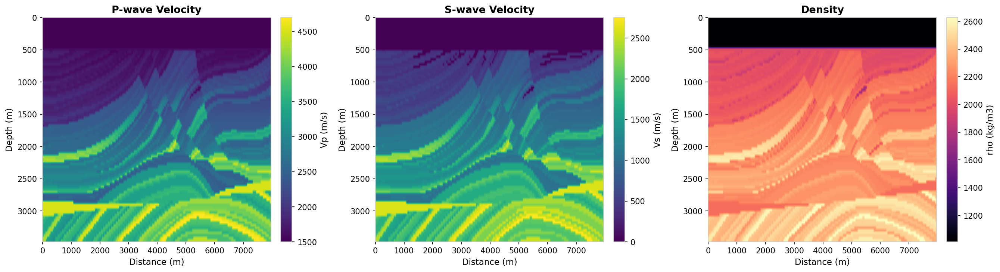

In [5]:
print("\n--- Visualize Elastic Model ---")

from geobrain.vis import plot_field, plot_gather, plot_section

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

plot_field(vp, dx=DX, dz=DZ, ax=axes[0], cmap='viridis', label='Vp (m/s)')
axes[0].set_title('P-wave Velocity')

plot_field(vs, dx=DX, dz=DZ, ax=axes[1], cmap='viridis', label='Vs (m/s)')
axes[1].set_title('S-wave Velocity')

plot_field(rho, dx=DX, dz=DZ, ax=axes[2], cmap='magma', label='rho (kg/m3)')
axes[2].set_title('Density')

plt.tight_layout()
plt.savefig(os.path.join(FIGS_DIR, '08_elastic_model.png'))
plt.show()

## Create Elastic Model

`IsotropicElasticModel` requires the full Vp, Vs, ρ triplet, unlike the
acoustic model which only needs Vp and ρ.

In [6]:
print("\n--- Create Elastic Model ---")

from geobrain.physics.wave import (
    GridConfig,
    BoundaryConfig,
    IsotropicElasticModel,
    AcousticModel,
    Source,
    Receiver,
    Survey,
    ElasticPropagator,
    AcousticPropagator,
    RickerWavelet,
)

grid = GridConfig(
    nx=NX,
    nz=NZ,
    dx=DX,
    dz=DZ,
    ox=0.0,
    oz=0.0,
)

boundary = BoundaryConfig(
    type='pml',
    n_layers=30,
    free_surface=True,
    alpha=0.007,
)

model = IsotropicElasticModel(
    grid=grid,
    boundary=boundary,
    vp=vp,
    vs=vs,
    rho=rho,
    device=device,
    dtype=dtype,
)

print(model)


--- Create Elastic Model ---
IsotropicElasticModel with parameters ['vp', 'vs', 'rho']:
  vp  :  1500.00 -  4700.00 m/s   , grad=False, bounds=[None, None]
  vs  :     0.00 -  2752.00 m/s   , grad=False, bounds=[None, None]
  rho :  1010.00 -  2627.00 kg/m³ , grad=False, bounds=[None, None]
  Grid: 200 x 88, dx=40.00m
  Origin: (0.00, 0.00)m
  Boundary: pml, 30 layers
  Free surface: True



## Setup Survey Geometry


--- Setup Survey Geometry ---
Sources: 40 shots
Receivers: 200 per shot
Survey:
  Shots: 40
  Receivers: 200
  Time: 3000 samples @ 3.00 ms
  Receiver masks: No


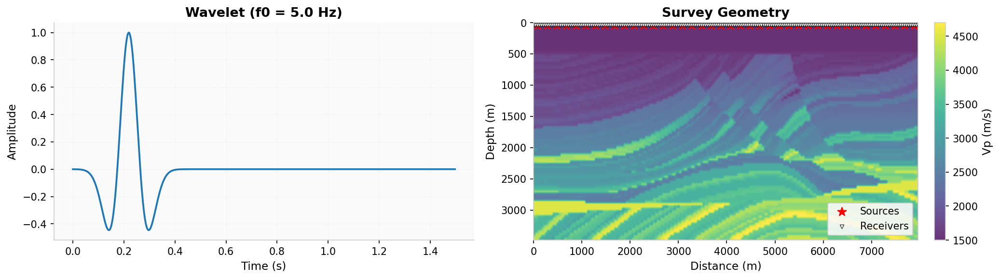

In [7]:
print("\n--- Setup Survey Geometry ---")

# Source positions (every 5 grid points)
src_x = np.array([i for i in range(2, grid.nx - 1, 5)])
src_z = np.array([1 for _ in range(len(src_x))])
n_shots = len(src_x)

# Receiver positions (every grid point)
rcv_x = np.arange(0, grid.nx, 1)
rcv_z = np.ones(len(rcv_x), dtype=int)

print(f"Sources: {n_shots} shots")
print(f"Receivers: {len(rcv_x)} per shot")

# Generate wavelet
ricker = RickerWavelet()
wavelet_tensor, _ = ricker(f0=F0, dt=DT)
wavelet_np = wavelet_tensor.numpy()

# Pad wavelet to match nt
if len(wavelet_np) < NT:
    wavelet_np = np.pad(wavelet_np, (0, NT - len(wavelet_np)), mode='constant')
elif len(wavelet_np) > NT:
    wavelet_np = wavelet_np[:NT]

# Integrate wavelet (velocity source)
from scipy.integrate import cumulative_trapezoid
src_wavelet = cumulative_trapezoid(wavelet_np, initial=0)

# Create Source
source = Source(nt=NT, dt=DT, f0=F0)

for i in range(len(src_x)):
    source.add_source(
        x=int(src_x[i]),
        z=int(src_z[i]),
        wavelet=src_wavelet,
        source_type='mt',
        moment_tensor=np.eye(3),
    )

# Create Receiver
receiver = Receiver(nt=NT, dt=DT)
receiver.add_receivers(x=rcv_x, z=rcv_z, rcv_type='pr')

# Create Survey
survey = Survey(source=source, receiver=receiver)
print(survey)

# Visualize survey geometry
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Wavelet
t_wav = np.arange(500) * DT
axes[0].plot(t_wav, wavelet_np[:500], color='#1f77b4', linewidth=1.8, label='Ricker')
axes[0].set_xlabel('Time (s)')
axes[0].set_ylabel('Amplitude')
axes[0].set_title(f'Wavelet (f0 = {F0} Hz)')
axes[0].grid(True, alpha=0.3, linestyle='--')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Geometry overlay on velocity model
plot_field(vp, dx=DX, dz=DZ, ax=axes[1], cmap='viridis',
          label='Vp (m/s)', alpha=0.8)
axes[1].scatter(src_x * DX, src_z * DZ, c='red', marker='*', s=80, label='Sources')
axes[1].scatter(rcv_x * DX, rcv_z * DZ, c='white', marker='v', s=15,
                edgecolors='black', linewidth=0.5, label='Receivers')
axes[1].set_title('Survey Geometry')
axes[1].legend(loc='lower right')

plt.tight_layout()
plt.savefig(os.path.join(FIGS_DIR, '08_survey_geometry.png'))
plt.show()

## Elastic Forward Simulation

`ElasticPropagator.forward()` solves the elastic wave equation and returns
three components per receiver: pressure (`p`), horizontal velocity (`vx`),
and vertical velocity (`vz`).

In [8]:
print("\n--- Elastic Forward Simulation ---")

propagator = ElasticPropagator(
    model=model,
    survey=survey,
    device=device,
    dtype=dtype,
)

print(f"Running elastic forward simulation for {n_shots} shots...")

result = propagator.forward(checkpoint_segments=4)

rcv_p = result.p
rcv_vx = result.vx
rcv_vz = result.vz
forward_wavefield = result.forward_wavefield_p

print(f"Simulation complete!")
print(f"Pressure data shape: {rcv_p.shape}")
print(f"Vx data shape: {rcv_vx.shape}")
print(f"Vz data shape: {rcv_vz.shape}")
print(f"Wavefield shape: {forward_wavefield.shape}")


--- Elastic Forward Simulation ---
Running elastic forward simulation for 40 shots...
Simulation complete!
Pressure data shape: torch.Size([40, 3000, 200])
Vx data shape: torch.Size([40, 3000, 200])
Vz data shape: torch.Size([40, 3000, 200])
Wavefield shape: torch.Size([88, 200])


## Visualization — Shot Gathers (P, Vx, Vz)


--- Visualization: Elastic Shot Gathers ---


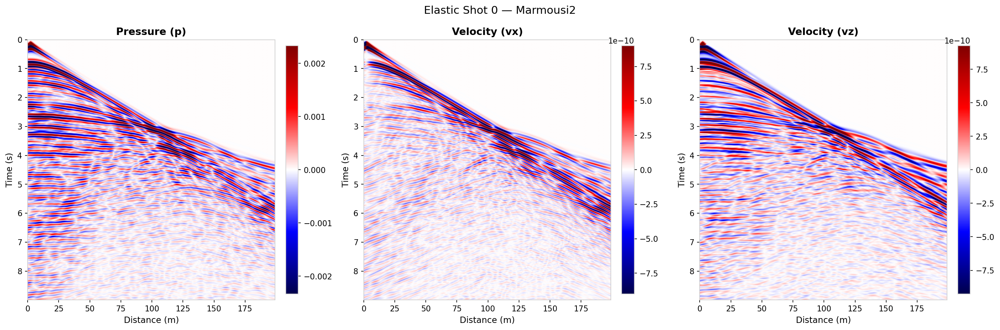

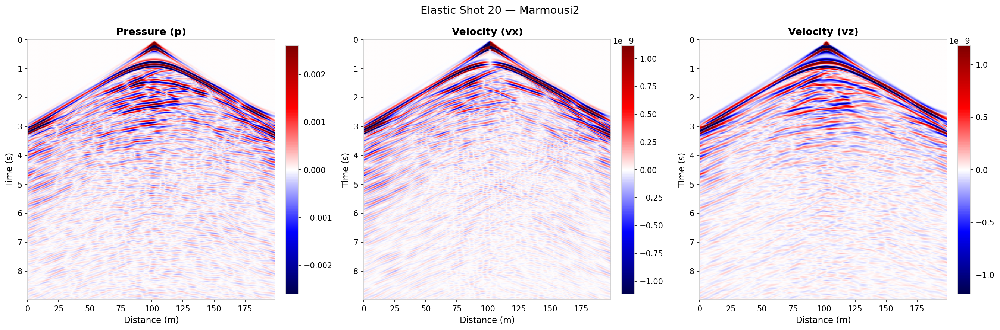

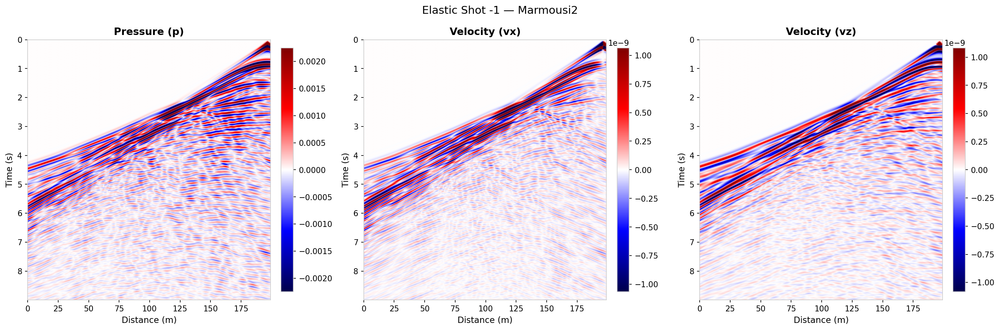

In [9]:
print("\n--- Visualization: Elastic Shot Gathers ---")

rcv_p_np = rcv_p.cpu().numpy() if torch.is_tensor(rcv_p) else rcv_p
rcv_vx_np = rcv_vx.cpu().numpy() if torch.is_tensor(rcv_vx) else rcv_vx
rcv_vz_np = rcv_vz.cpu().numpy() if torch.is_tensor(rcv_vz) else rcv_vz

# Plot selected shots
for i_shot in [0, 20, -1]:
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    for ax, data, title in zip(
        axes,
        [rcv_p_np[i_shot], rcv_vx_np[i_shot], rcv_vz_np[i_shot]],
        ['Pressure (p)', 'Velocity (vx)', 'Velocity (vz)'],
    ):
        plot_section(data, dt=DT, dx=1.0, ax=ax)
        ax.set_title(title)

    plt.suptitle(f'Elastic Shot {i_shot} — Marmousi2', fontsize=14)
    plt.tight_layout()
    plt.savefig(os.path.join(FIGS_DIR, f'08_elastic_shot_{i_shot}.png'))
    plt.show()

## Acoustic vs. Elastic Comparison

Side-by-side comparison using identical model and acquisition:

1. **Shot gather**: Acoustic vs. elastic pressure component
2. **Difference**: Elastic − Acoustic highlights S-wave and mode-conversion
   energy
3. **Single-trace overlay**: detailed waveform comparison at one receiver


--- Acoustic vs. Elastic Comparison ---


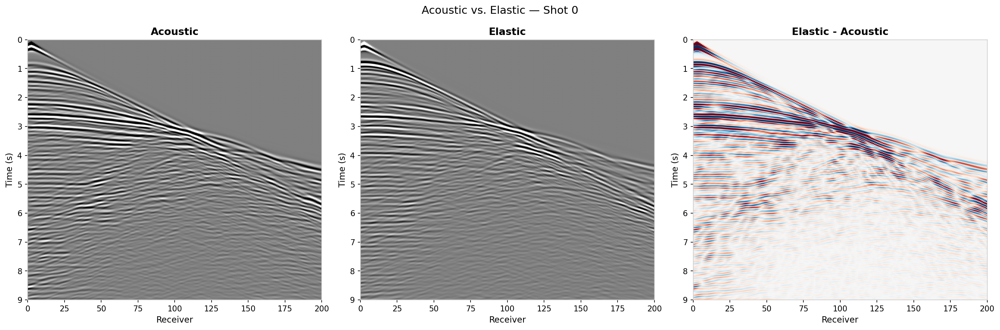

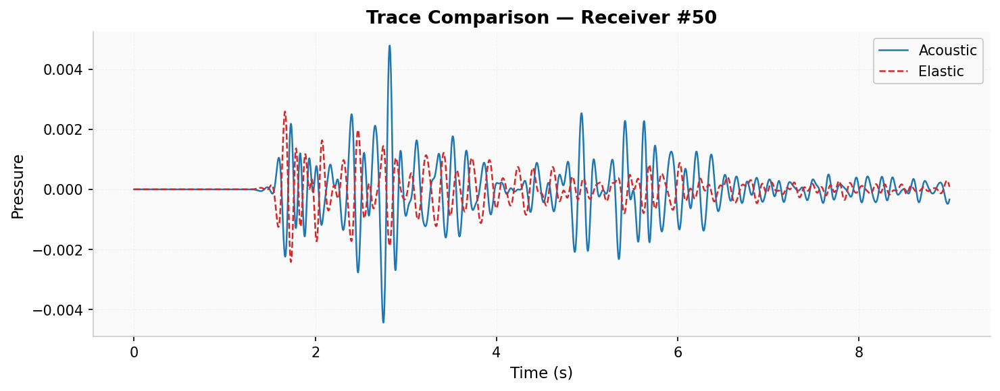

Elastic seismogram shows S-wave arrivals and mode conversions
that are absent in the acoustic simulation.


In [10]:
print("\n--- Acoustic vs. Elastic Comparison ---")

# Run acoustic simulation with the same Vp and rho
model_ac = AcousticModel(
    grid=grid,
    boundary=boundary,
    vp=vp,
    rho=rho,
    vp_grad=False,
    rho_grad=False,
    device=device,
    dtype=dtype,
)

prop_ac = AcousticPropagator(
    model=model_ac,
    survey=survey,
    device=device,
    dtype=dtype,
)

result_ac = prop_ac.forward(checkpoint_segments=4)

# Compare a single shot
i_shot = 0
p_ac = result_ac.p[i_shot].cpu().numpy()
p_el = rcv_p_np[i_shot]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

clip = np.percentile(np.abs(p_ac), 99) * 0.8
if clip == 0:
    clip = 1.0
extent = [0, len(rcv_x), NT * DT, 0]

axes[0].imshow(p_ac, extent=extent, aspect='auto', cmap='gray',
               vmin=-clip, vmax=clip)
axes[0].set_title('Acoustic')
axes[0].set_xlabel('Receiver')
axes[0].set_ylabel('Time (s)')

axes[1].imshow(p_el, extent=extent, aspect='auto', cmap='gray',
               vmin=-clip, vmax=clip)
axes[1].set_title('Elastic')
axes[1].set_xlabel('Receiver')
axes[1].set_ylabel('Time (s)')

# Difference
diff = p_el - p_ac
clip_diff = np.percentile(np.abs(diff), 99) * 0.8
if clip_diff == 0:
    clip_diff = 1.0
axes[2].imshow(diff, extent=extent, aspect='auto', cmap='RdBu_r',
               vmin=-clip_diff, vmax=clip_diff)
axes[2].set_title('Elastic - Acoustic')
axes[2].set_xlabel('Receiver')
axes[2].set_ylabel('Time (s)')

plt.suptitle(f'Acoustic vs. Elastic — Shot {i_shot}', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(FIGS_DIR, '08_acoustic_vs_elastic.png'))
plt.show()

# Compare single trace
trace_idx = len(rcv_x) // 4
t_axis = np.arange(NT) * DT

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(t_axis, p_ac[:, trace_idx], color='#1f77b4', linewidth=1.2, label='Acoustic')
ax.plot(t_axis, p_el[:, trace_idx], color='#d62728', linewidth=1.2, linestyle='--', label='Elastic')
ax.set_xlabel('Time (s)')
ax.set_ylabel('Pressure')
ax.set_title(f'Trace Comparison — Receiver #{trace_idx}')
ax.legend()
ax.grid(True, alpha=0.3, linestyle='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(FIGS_DIR, '08_trace_comparison.png'))
plt.show()

print("Elastic seismogram shows S-wave arrivals and mode conversions")
print("that are absent in the acoustic simulation.")

## Wavefield Energy

Log-scale energy maps for the P, Vx, and Vz components show the spatial
distribution of wave energy and help identify dominant wave modes.


--- Forward Wavefield Energy ---


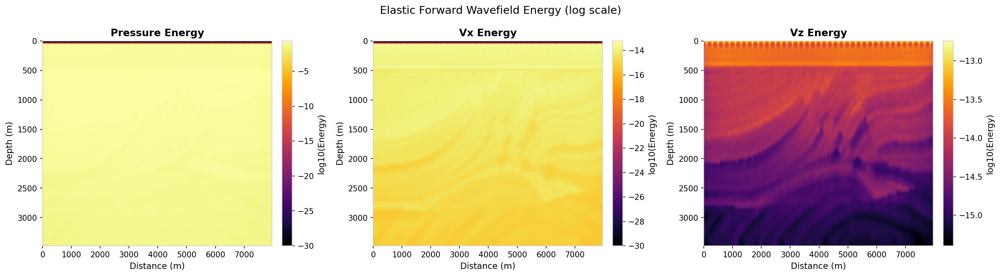

In [11]:
print("\n--- Forward Wavefield Energy ---")

fwd_p = result.forward_wavefield_p.detach().cpu().numpy()
fwd_vx = result.forward_wavefield_vx.detach().cpu().numpy()
fwd_vz = result.forward_wavefield_vz.detach().cpu().numpy()

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, data, title in zip(
    axes,
    [fwd_p, fwd_vx, fwd_vz],
    ['Pressure Energy', 'Vx Energy', 'Vz Energy'],
):
    # Log scale for better visualization
    data_log = np.log10(data + 1e-30)
    plot_field(data_log, dx=DX, dz=DZ, ax=ax, cmap='inferno',
              label='log10(Energy)')
    ax.set_title(title)

plt.suptitle('Elastic Forward Wavefield Energy (log scale)', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(FIGS_DIR, '08_wavefield_energy.png'))
plt.show()

## Wavefield Animation

Animated elastic wavefield propagation.  Observe P- and S-waves travelling
at different speeds and mode conversions at interfaces.


--- Wavefield Snapshot Animation ---
Running single-shot simulation with snapshots (every 10 steps)...
Captured 300 snapshots, shape: (300, 88, 200)
Time range: 0.030s - 9.000s
Animation saved to elastic_wavefield.gif


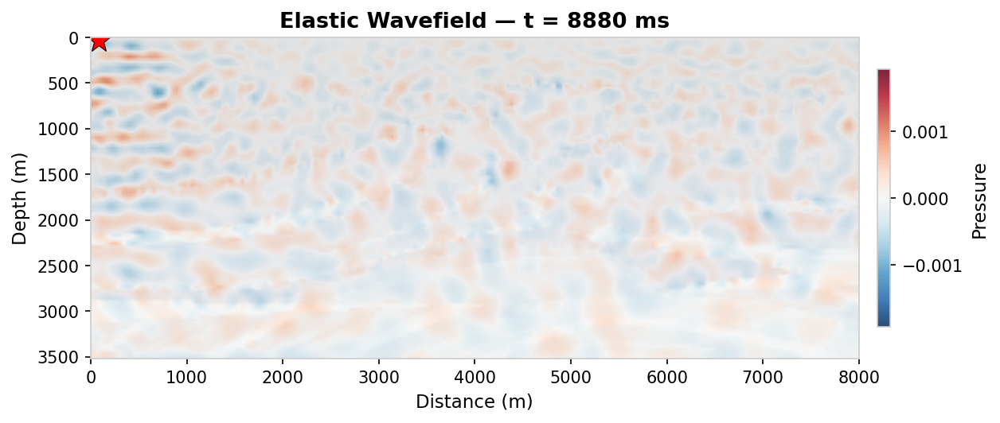

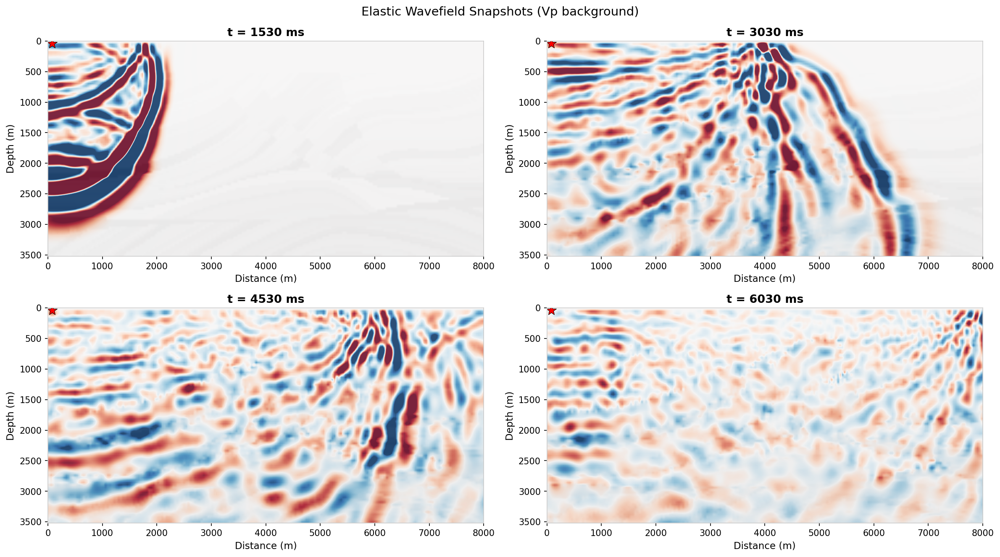

In [12]:
print("\n--- Wavefield Snapshot Animation ---")

from matplotlib.animation import FuncAnimation, PillowWriter

# Run single-shot simulation with snapshots
SNAP_EVERY = 10  # Snapshot every 10 time steps
i_shot_anim = 0

print(f"Running single-shot simulation with snapshots (every {SNAP_EVERY} steps)...")

with torch.no_grad():
    result_snap = propagator.forward(
        shot_index=i_shot_anim,
        snapshot_every=SNAP_EVERY,
    )

snap_data = result_snap.snapshots.numpy()  # (n_snaps, nz, nx)
n_snaps = snap_data.shape[0]
snap_times = np.arange(1, n_snaps + 1) * SNAP_EVERY * DT

print(f"Captured {n_snaps} snapshots, shape: {snap_data.shape}")
print(f"Time range: {snap_times[0]:.3f}s - {snap_times[-1]:.3f}s")

# Determine wavefield clip value (from non-zero snapshots)
nonzero_snaps = snap_data[snap_data.shape[0] // 5:]  # Skip early quiet frames
clip_val = np.percentile(np.abs(nonzero_snaps), 99.5) * 0.6
if clip_val == 0:
    clip_val = np.abs(snap_data).max() * 0.5
if clip_val == 0:
    clip_val = 1.0

extent = [0, NX * DX, NZ * DZ, 0]

# Create figure (smaller size for GIF)
fig, ax = plt.subplots(figsize=(10, 3.5))

# Vp background (geological structure)
im_vp = ax.imshow(vp, extent=extent, aspect='auto', cmap='bone',
                   alpha=0.5, interpolation='bilinear')

# Wavefield overlay
im_wf = ax.imshow(snap_data[0], extent=extent, aspect='auto',
                   cmap='RdBu_r', vmin=-clip_val, vmax=clip_val,
                   alpha=0.85, interpolation='bilinear')

# Source marker
ax.plot(src_x[i_shot_anim] * DX, src_z[i_shot_anim] * DZ,
        'r*', markersize=15, markeredgecolor='k', markeredgewidth=0.5)

ax.set_xlabel('Distance (m)')
ax.set_ylabel('Depth (m)')
title = ax.set_title(f'Elastic Wavefield — t = {snap_times[0]*1000:.0f} ms')
plt.colorbar(im_wf, ax=ax, label='Pressure', shrink=0.8, pad=0.02)

# Subsample frames to reduce GIF size
frame_step = max(1, n_snaps // 60)
frame_indices = list(range(0, n_snaps, frame_step))

def update(frame):
    im_wf.set_data(snap_data[frame])
    title.set_text(f'Elastic Wavefield — t = {snap_times[frame]*1000:.0f} ms')
    return [im_wf, title]

anim = FuncAnimation(fig, update, frames=frame_indices, interval=80, blit=True)

# Save as GIF
gif_path = "elastic_wavefield.gif"
anim.save(gif_path, writer=PillowWriter(fps=15), dpi=80)
print(f"Animation saved to {gif_path}")
plt.show()

# Also save a few key snapshots as static images
key_frames = [n_snaps // 6, n_snaps // 3, n_snaps // 2, 2 * n_snaps // 3]
fig, axes = plt.subplots(2, 2, figsize=(16, 9))

for ax, idx in zip(axes.flat, key_frames):
    ax.imshow(vp, extent=extent, aspect='auto', cmap='gray_r',
              alpha=0.35, interpolation='bilinear')
    ax.imshow(snap_data[idx], extent=extent, aspect='auto',
              cmap='RdBu_r', vmin=-clip_val, vmax=clip_val,
              alpha=0.85, interpolation='bilinear')
    ax.plot(src_x[i_shot_anim] * DX, src_z[i_shot_anim] * DZ,
            'r*', markersize=12, markeredgecolor='k', markeredgewidth=0.5)
    ax.set_title(f't = {snap_times[idx]*1000:.0f} ms')
    ax.set_xlabel('Distance (m)')
    ax.set_ylabel('Depth (m)')

plt.suptitle('Elastic Wavefield Snapshots (Vp background)', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(FIGS_DIR, '08_wavefield_snapshots.png'))
plt.show()